# **1. Introduction**

### **1.1 Background**

Airbnb has revolutionized the travel and accommodation industry by creating an online marketplace where hosts can offer unique short-term rental experiences to guests worldwide. Since its launch, Airbnb has grown rapidly, connecting millions of travelers with diverse lodging options in over 100,000 cities across more than 220 countries as of December 31, 2023 (1). This platform’s flexibility allows hosts to rent out anything from single rooms to entire homes, making it a preferred choice for both casual and long-term travelers.

In popular destinations like Bangkok, Airbnb has reshaped the local accommodation landscape by offering tourists a broader range of options beyond traditional hotels. Bangkok’s vibrant culture, bustling urban life, and affordability attract millions of visitors each year, establishing it as one of Southeast Asia’s top locations for Airbnb listings.

For hosts, optimizing Airbnb listings has become increasingly important as competition grows. By analyzing Airbnb data, hosts can gain insights into pricing trends, booking patterns, and guest preferences to enhance their listings and maximize revenue. While common analyses explore factors such as booking frequency, property types, and guest ratings, there is a growing need for spatial analysis to understand how location specifically impacts price.

This project will take an in-depth look at the Bangkok Airbnb market from a spatial perspective, examining the influence of proximity to key locations like tourist attractions, shopping centers, and city hubs on listing prices. By incorporating neighborhood boundaries and distance measurements, this analysis will reveal patterns that help hosts strategically position and price their listings. This approach provides valuable insights into optimizing listing prices based on geographic factors, enabling hosts to make data-driven decisions to increase revenue in a highly competitive market.

### **1.2 Problem Statement**

As the Airbnb market in Bangkok continues to expand, competition among hosts intensifies. To stay competitive, hosts need to understand the critical factors that influence the pricing and performance of their listings. Key attributes such as room type, location, availability, and guest reviews play a significant role in determining a listing’s price and popularity. Data-driven insights can help hosts optimize these attributes to maximize both revenue and occupancy rates.

This project aims to provide a deeper understanding of Airbnb listing performance in Bangkok by addressing the following key questions:

1. What factors contribute to variations in Airbnb listing prices?
2. How do listing attributes, such as room type and availability, affect overall performance?
3. Where are the Airbnb hotspots in Bangkok?
4. Are there spatial patterns in pricing across specific neighborhoods?
5. How does location impact a listing’s price?


-----
# **2. Data**

### **2.1 Data Overview**

For solving this problems, the dataset "Airbnb Listings Bangkok.csv" from Kaggle will be used. The data can be accessed [here](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF). The data cosists of 15 columns, with the detailed as below: 
* `id` : Airbnb's unique identifier for the listing
* `name` : name of the listing
* `host_id` : Airbnb's unique identifier for the host/user
* `host_name` : host (listing owner) name
* `neighbourhood` : listing neighborhood which is geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles
* `latitude` : listing latitude coordinate in the World Geodetic System (WGS84) projection
* `longitude` : listing longitude coordinate in the World Geodetic System (WGS84) projection
* `room_type` : room type of the listing, including entire place (apartment), private room, hotel room, and shared room.
* `price` : daily price in local currency (baht)
* `minimum_nights` : minimum number of night stays for the listing 
* `number_of_reviews` : number of reviews the listing has
* `last_review` : the date of the last/newest review
* `reviews_per_month` : number of reviews per month
* `calculated_host_listings_count` : number of listings from the same host
* `availability_365` : number of days of availability within 365 days. Note a listing may not be available because it has been booked by a guest or blocked by the host.
* `number_of_reviews_ltm` : number of reviews in the last 12 months

### **2.2 Import Libraries and Load Dataset**

In [356]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind

import warnings
warnings.filterwarnings("ignore")

In [357]:
df = pd.read_csv('Airbnb Listings Bangkok.csv')

### **2.3 Data Understanding**

##### **Data Overview**

In [358]:
# Fetching the number of rows & columns of the data set
print(f'Number of rows and columns in the df is {df.shape}')

Number of rows and columns in the df is (15854, 17)


In [359]:
# General information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

Based on the information above, we can observe the following:
* The dataset contains 15,854 entries (rows) and 17 attributes (variables or columns). The unnecessary variables will be discarded during data cleaning.
* Several variables have missing values, which will be addressed during the data cleaning process.
* The dataset includes three different data types: int64, object, and float64, which can be converted as needed for the analysis.

In [360]:
# Show the first and last 5 entries of the DataFrame
display(df.head(),df.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


##### **Convert the Data Type**

In [361]:
# Set as categorical data
df.room_type = df.room_type.astype('category')
df.neighbourhood = df.neighbourhood.astype('category')

# Set as datetime data
df.last_review = pd.to_datetime(df.last_review)

Before starting the data cleaning process, the room_type and neighbourhood variables will be converted to the “category” type, and last_review will be converted to “datetime".  Converting string variables (object) to categorical types helps reduce memory usage, while converting to “datetime” enables time series analysis.

In [362]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15854 non-null  int64         
 1   id                              15854 non-null  int64         
 2   name                            15846 non-null  object        
 3   host_id                         15854 non-null  int64         
 4   host_name                       15853 non-null  object        
 5   neighbourhood                   15854 non-null  category      
 6   latitude                        15854 non-null  float64       
 7   longitude                       15854 non-null  float64       
 8   room_type                       15854 non-null  category      
 9   price                           15854 non-null  int64         
 10  minimum_nights                  15854 non-null  int64         
 11  nu

### **2.4 Data Cleaning**

##### **Delete Whitespace**

In [363]:
df = df.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

##### **Check Duplicate Entries**

In [364]:
df.duplicated().sum()

0

There is no duplicated rows in this dataset.

In [365]:
# Check for duplicate listings that share the same values in the following columns:
# 'name', 'host_name', 'price', 'longitude', 'latitude',  'room_type', 'last_review'

df_duplicate = df[df.duplicated(subset=['name', 'host_name', 'price', 'longitude', 'latitude',  'room_type', 'last_review'])]
display(df_duplicate)

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5976,5976,28907857,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,NaT,NaN,9,361,0
8790,8790,37954129,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,NaT,NaN,4,180,0
15121,15121,767128654727724698,Sathon Luxury Loft/China Town/Icon Siam,276781306,Alex,Sathon,13.710777,100.519891,Entire home/apt,1580,1,0,NaT,NaN,13,339,0
15186,15186,765691389894680033,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,44,340,0
15191,15191,765721954905526928,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,40,340,0
15550,15550,781514912980696908,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,NaT,NaN,33,360,0
15615,15615,780896408611028752,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,344327171,Alice,Huai Khwang,13.757097,100.568486,Entire home/apt,2533,3,0,NaT,NaN,40,360,0
15831,15831,790280473547745220,Family Room for 4 People,340188343,Rachan,Vadhana,13.740168,100.556320,Private room,2237,1,0,NaT,NaN,14,360,0


From the information above, we can see that some entries have similar listing attributes. To understand the specifics, we will examine each one individually.

In [376]:
# Check listings with attributes similar to the entry in the dataframe index ‘5976’
df[(df['name'] == 'NA BANGLAMPOO GUEST HOUSE') & (df['price']==1400)]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5890,5890,28831409,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.76279,100.4979,Private room,1400,1,0,NaT,NaN,9,361,0
5976,5976,28907857,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.76279,100.4979,Private room,1400,1,0,NaT,NaN,9,361,0


In [375]:
# Check listings with attributes similar to the entry in the dataframe index ‘8790'
df[(df['latitude'] == 13.920720 ) & (df['longitude'] == 100.575780)]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
8789,8789,37953702,small1,97598307,Soo,Don Mueang,13.92072,100.57578,Shared room,350,1,0,NaT,NaN,4,180,0
8790,8790,37954129,small1,97598307,Soo,Don Mueang,13.92072,100.57578,Shared room,350,1,0,NaT,NaN,4,180,0


In [384]:
# Check listings with attributes similar to the entry in the dataframe index ‘15121'
df[(df['name']=='Sathon Luxury Loft/China Town/Icon Siam') & (df['host_name']=='Alex')]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15120,15120,767112544721073364,Sathon Luxury Loft/China Town/Icon Siam,276781306,Alex,Sathon,13.710777,100.519891,Entire home/apt,1580,1,0,NaT,NaN,13,326,0
15121,15121,767128654727724698,Sathon Luxury Loft/China Town/Icon Siam,276781306,Alex,Sathon,13.710777,100.519891,Entire home/apt,1580,1,0,NaT,NaN,13,339,0


In [408]:
# Check listings with attributes similar to the entry in the dataframe index ‘15550'
df[(df['name']=='Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9') & (df['host_id']==20133201)]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15549,15549,781507744450884041,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,NaT,NaN,33,360,0
15550,15550,781514912980696908,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,NaT,NaN,33,360,0


In [404]:
# Check listings with attributes similar to the entry in the dataframe index ‘15615'
df[(df['name']=='Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9') & (df['host_id']==344327171) ]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15614,15614,780889390373160493,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,344327171,Alice,Huai Khwang,13.757097,100.568486,Entire home/apt,2533,3,0,NaT,NaN,40,360,0
15615,15615,780896408611028752,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,344327171,Alice,Huai Khwang,13.757097,100.568486,Entire home/apt,2533,3,0,NaT,NaN,40,360,0


In [401]:
# Check listings with attributes similar to the entry in the dataframe index ‘15831'
df[(df['name']=='Family Room for 4 People') & (df['price']==2237) ]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15829,15829,790278230325843023,Family Room for 4 People,340188343,Rachan,Vadhana,13.740168,100.55632,Private room,2237,1,0,NaT,NaN,14,360,0
15831,15831,790280473547745220,Family Room for 4 People,340188343,Rachan,Vadhana,13.740168,100.55632,Private room,2237,1,0,NaT,NaN,14,360,0


The six entries checked above follow a similar pattern, where each has another row with identical attributes, with the only difference being their `id`. This recurring similarity suggests that these listings may have been registered twice. To avoid any misinterpretation in the analysis, I will remove one entry from each pair.

In [386]:
# Check listings with attributes similar to the entry in the dataframe index ‘15186'
df[(df['name'] == 'Sathon Luxury 2 br/China Town/Icon Siam') & (df['host_name']=='Tricia')]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15183,15183,765632824291529126,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,44,340,0
15186,15186,765691389894680033,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,44,340,0
15187,15187,765693830342277946,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,1,2022-12-11,1.0,44,340,1


In [409]:
# Check listings with attributes similar to the entry in the dataframe index ‘15191'
df[(df['name']=='Sathon Luxury 2 br/China Town/Icon Siam') & (df['host_name']=='Alice')]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15189,15189,765709560039806354,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,1,2022-11-30,1.0,40,340,1
15190,15190,765716244664642439,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,40,340,0
15191,15191,765721954905526928,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,40,340,0


Unlike previous cases, which involved two duplicate entries, this listing has three duplicates, with one entry showing booking history while the others have none. To ensure accurate analysis, I retained the entry with booking history and removed the two unbooked entries. This approach preserves the most relevant data and minimizes the inclusion of inactive or duplicate records.

In [410]:
# Delete duplicates
df.drop_duplicates(subset=['name', 'host_name', 'price', 'longitude', 'latitude',  'room_type', 'last_review'], inplace=True)

In [412]:
# Delete additional duplicates
index_to_drop = [15183, 15190]

df = df.drop(index_to_drop, axis=0)

In [414]:
df.shape

(15844, 17)

A total of ten duplicate entries have been removed.

##### **Check Missing Values**

In [415]:
# Variables sorted by the number and percentage of missing values in each column
df.isna().sum().sort_values(ascending=False), (df.isna().sum()/df.shape[0]*100).round(2).sort_values(ascending=False)

(reviews_per_month                 5780
 last_review                       5780
 name                                 8
 host_name                            1
 Unnamed: 0                           0
 minimum_nights                       0
 availability_365                     0
 calculated_host_listings_count       0
 number_of_reviews                    0
 room_type                            0
 price                                0
 id                                   0
 longitude                            0
 latitude                             0
 neighbourhood                        0
 host_id                              0
 number_of_reviews_ltm                0
 dtype: int64,
 reviews_per_month                 36.48
 last_review                       36.48
 name                               0.05
 host_name                          0.01
 Unnamed: 0                         0.00
 minimum_nights                     0.00
 availability_365                   0.00
 calculated_host_l

<Axes: >

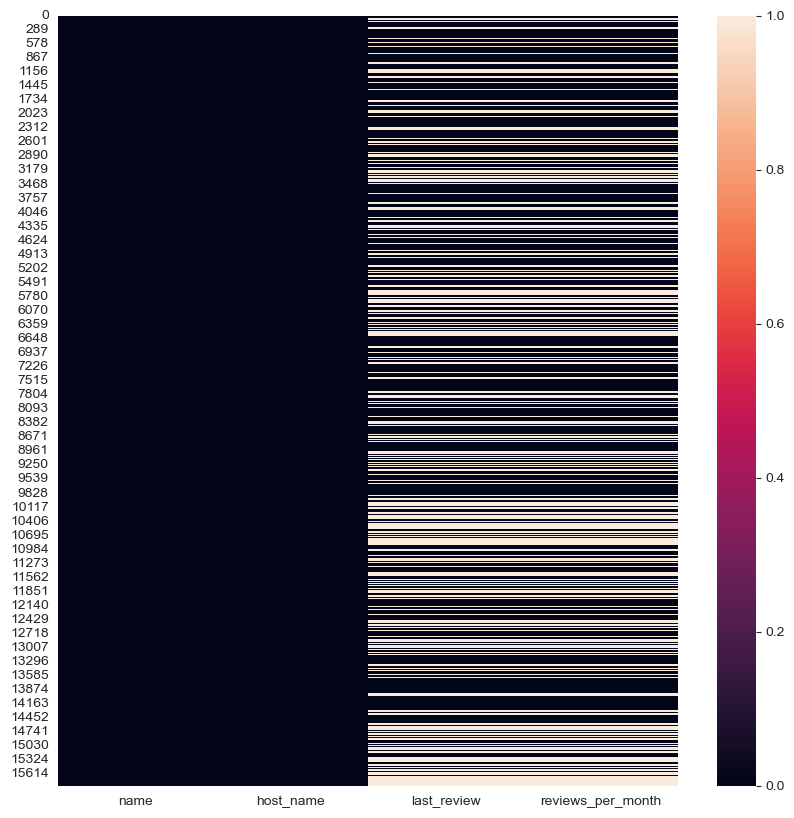

In [416]:
# Generates a visualization of the entries with missing values
plt.figure(figsize=(10,10))
sns.heatmap(df[['name','host_name', 'last_review', 'reviews_per_month']].isna())

* Based on the upper limits identified for `minimum_nights` (16) and `number_of_reviews` (32.5), applying these thresholds would result in the removal of a substantial portion of the data, with 19.99% and 14.15% respectively. To avoid losing valuable insights, these data points will be retained, and `minimum_nights` will be categorized as a categorical variable for further analysis, as well as `reviews_per_month` variable. 
* The median will be used as the measure of central tendency, as it is more robust to outliers. 
* Other numerical variables such as calculated_host_listings_count, and number_of_reviews_ltm will remain unchanged, as they are unlikely to be focus to the further analysis.

From the analysis and heatmap above, we can see the following:  
* Four variables contain *missing values*:  `name`, `host_name`, `last_review` and `reviews_per_month`
* The *missing value* in the `name`, and `host_name` columns represent a small percentage (<1%), while the missing values in the `last_review` and `reviews_per_month` columns are significantly higher, reaching up to 36.5%. 
* The *missing value* in `last_review` and `reviews_per_month` appear to be correlated; if last_review is missing, it’s likely that reviews_per_month is also missing.

##### Handle The Missing Values

In [417]:
# Handle the 'name' and 'host_name' columns
df[(df['name'].isna()) | (df['host_name'].isna())]

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,NaN,1,365,0
544,544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,NaN,1,365,0
572,572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,NaN,1,365,0
669,669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,NaN,1,365,0
1030,1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,NaN,1,365,0
1282,1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,NaN,1,365,0
2075,2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0
3571,3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


The `name` and `host_name` columns contain only a few missing values, which are negligible in relation to the overall dataset, meaning they can be removed without significant impact. Additionally, since AirBnB listings are required to include both a listing name and a host name, any entries lacking this information are likely to be errors or contain false data. To ensure the dataset is reliable and valid, these rows will need to be removed.

In [418]:
# Drop missing values in the name and host_name variables
df = df.dropna(subset=['name','host_name'])

In [419]:
# Confirm the total number of missing values after filling
df[['name', 'host_name']].isna().sum()

name         0
host_name    0
dtype: int64

It is confimed that both the `name` and `host_name` no longer has missing values.

In [420]:
# Handle the 'last_review' and 'reviews_per_month' variables
df[df['last_review'].isna() & df['reviews_per_month'].isna() & (df['number_of_reviews'] == 0)][['last_review', 'reviews_per_month', 'number_of_reviews']]

,last_review,reviews_per_month,number_of_reviews
1,NaT,NaN,0
2,NaT,NaN,0
4,NaT,NaN,0
7,NaT,NaN,0
14,NaT,NaN,0
...,...,...,...
15849,NaT,NaN,0
15850,NaT,NaN,0
15851,NaT,NaN,0
15852,NaT,NaN,0


From the code above, we can see that all entries where `last_review` and `reviews_per_month` are null also have a `number_of_reviews` value of 0. This implies that the missing values are likely a result of the listings having no reviews, which will influence how we approach handling the variables with missing data.

In [232]:
# Replace missing values in the review_per_month variable
df['reviews_per_month'] = df['reviews_per_month'].fillna(value=0)

The `last_review` and `reviews_per_month` columns have more than 5,000 missing values (36.5%), so removing these entries would not be practical and could introduce bias into the analysis, leading to inaccurate results. To address this, we will replace the missing values in `reviews_per_month` with 0, indicating these listings have no reviews. 

Meanwhile, the missing values in `last_review` will be filled with the median, given the right-skewed distribution shown in the graph below. Choosing the median helps reduce sensitivity to outliers, offering a more reliable estimate for these missing dates.

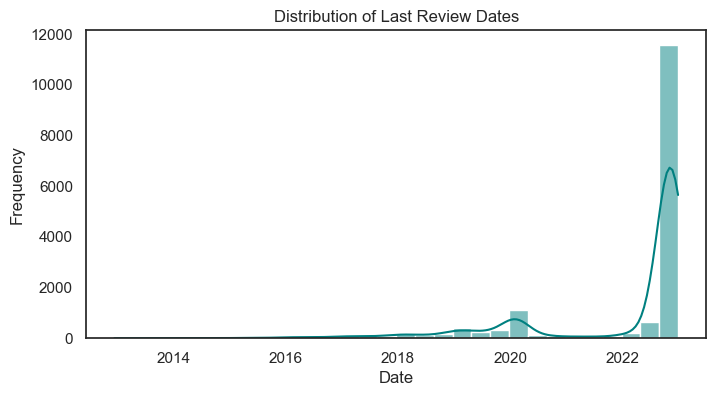

In [620]:
# Check the distribution of the last review column
plt.figure(figsize=(8,4))
sns.histplot(df['last_review'], bins=30, kde=True, color='teal')  
plt.title('Distribution of Last Review Dates')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.show()

In [422]:
# Replace missing values in the last_review variable
df['last_review'] = df['last_review'].fillna(df['last_review'].median())

In [423]:
# Confirm the total number of missing values after filling
df[['reviews_per_month', 'last_review']].isna().sum()

reviews_per_month    5774
last_review             0
dtype: int64

It is confimed that both the `reviews_per_month` and `last_review` no longer has missing values.

##### **Remove Irrelevant Columns From Data Set**

In [424]:
df.drop(['Unnamed: 0'], axis=1, inplace=True)

`Unnamed: 0` column will be unnecessary in this analysis, because the id will act as the unique identifier.

#### **Distribution and Outliers**

In [ ]:
# List of numeric variables
numeric_vars = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
                'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']

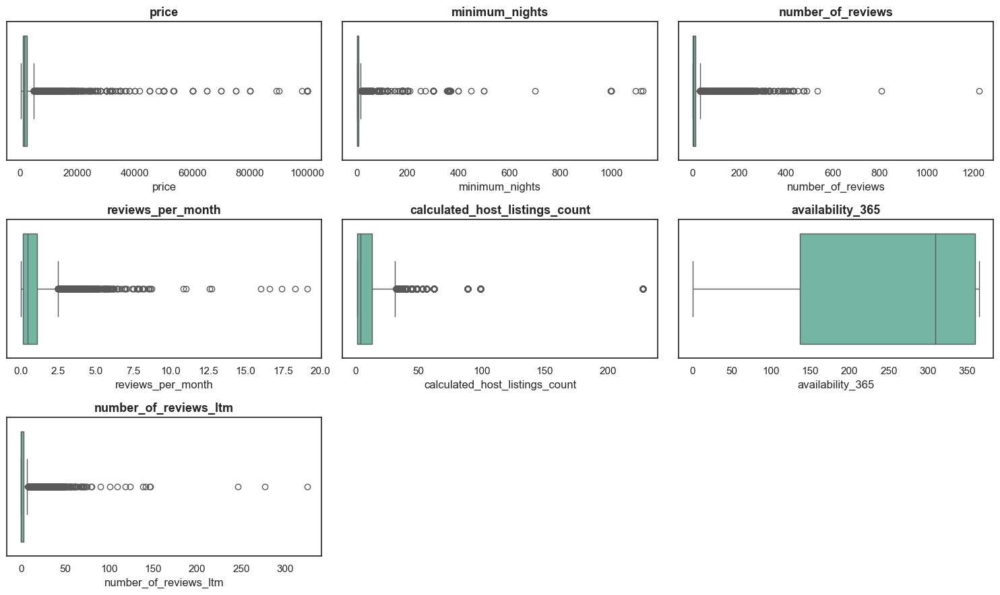

In [618]:
plt.figure(figsize=(15, 9), facecolor='white')
sns.set(style='white', palette='Set2')
plotnumber = 1
    
for feature in numeric_vars:
    ax = plt.subplot(3,3, plotnumber)
    sns.boxplot(x=feature, data=df);
    plt.title(feature, fontsize=13, fontweight='bold')
    plt.tight_layout()
    plotnumber += 1

The boxplots above show that most variables have outliers, except for `availability_365`. We will examine each variable with outliers in detail to determine the best approach for handling them.

##### **Check Anomalies in The Data**

In [426]:
# Check the statistics of the numerical variables
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.583500e+04,15835.000000,15835.000000,10061.000000,15835.000000,15835.000000,15835.000000
mean,3.219380e+03,15.308683,16.673571,0.813375,13.887843,244.263909,3.485696
std,2.498703e+04,50.843296,40.633792,1.090277,30.281963,125.863377,8.921469
min,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,9.000000e+02,1.000000,0.000000,0.120000,1.000000,137.000000,0.000000
50%,1.429000e+03,1.000000,2.000000,0.440000,4.000000,309.000000,0.000000
75%,2.431500e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


Some information draws our attention, such as:

* The descriptive statistics reveal a large variation in the `price` variable, with values ranging from a minimum of 0 to a maximum of 1,100,000. Since a price of 0 is unrealistic, this issue needs to be addressed.
* Additionally, `price` has a third quartile (Q3) of approximately 2,000 baht, while its maximum is around 1,000,000 baht, indicating the presence of clear outliers.
* For `minimum_nights`, the maximum value reaches 1,125, with a Q3 of 7, highlighting outliers in this variable as well.
* Variables such as `number_of_reviews`, `reviews_per_month`, `calculated_host_listings_count`, and `number_of_reviews_ltm` also likely contain significant outliers.

In [427]:
df[df['price']==0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,2022-10-24,NaN,1,0,0


There is a single entry where the Price is 0, and we will remove this entry from the dataset for further analysis.

In [428]:
# Deal with Price = 0
df = df[df['price'] != 0]

##### **Detect and Remove Outlier**

In [429]:
# Check if outlier exists in the variable Price
Q1_price = df['price'].quantile(0.25)
Q3_price = df['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price
print(f'IQR of the variable price: {IQR_price}')

# Define the limits
lower_price = Q1_price - 1.5 * IQR_price
upper_price = Q3_price + 1.5 * IQR_price

print(f'Lower limit of Price: {lower_price} baht')
print(f'Upper limit of Price: {upper_price} baht')
print(f'The original dataset has {df.shape[0]} entries')
print(f'{len(df[df.price > upper_price])} entries with price above 4800.0')
print(f'And it represents {((len(df[df.price > upper_price]) / df.shape[0])*100):.2f}% from the dataset')

IQR of the variable price: 1532.75
Lower limit of Price: -1399.125 baht
Upper limit of Price: 4731.875 baht
The original dataset has 15834 entries
1399 entries with price above 4800.0
And it represents 8.84% from the dataset


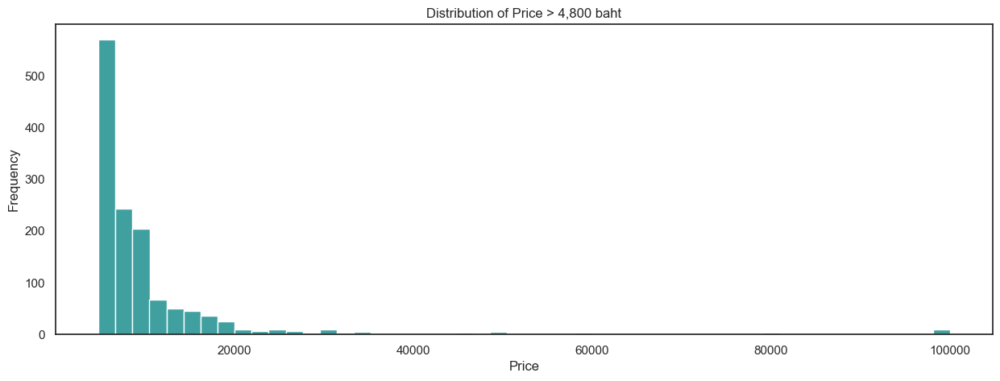

In [619]:
# Filter prices greater than 4800
df_check = df[df['price'] > 4800][['price']]

# Plot
plt.figure(figsize=(15, 5))
sns.histplot(data=df_check, x='price', bins=50, color='teal')  
plt.title('Distribution of Price > 4,800 baht')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

While there are no outliers on the lower end, a significant number exist on the upper end. Setting an upper limit at 4,725.625 baht would exclude 8.84% of the data, which is a substantial amount to remove. As the origin of outliers is unknown, and some may reflect natural variation or genuine extreme cases (e.g., luxury properties with high prices). Removing all of them could risk losing valuable information that reflects genuine marker segments. Based on the histogram's distribution above, we will retain most values but remove only the extreme ouliers above 100,000 baht, ensuring we capture the broader market trends without letting excessive values skew the analysis. As the consequences, we will use median as the measures of central tendency.

In [431]:
df = df[df['price'] <= 100000]

In [436]:
def identify_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define limits
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    
    # Print results
    print(f'IQR of the variable {column_name}: {IQR}')
    print(f'Upper limit of {column_name}: {upper_limit}')
    print(f'Lower limit of {column_name}: {lower_limit}')
    print(f'The original dataset has {df.shape[0]} entries')
    print(f'{len(df[df[column_name] > upper_limit])} entries with {column_name} above {upper_limit}')
    print(f'And it represents {((len(df[df[column_name] > upper_limit]) / df.shape[0]) * 100):.2f}% of the dataset\n')

# Apply the function to the desired columns
columns_to_check = ['minimum_nights', 'number_of_reviews', 'reviews_per_month']
for column in columns_to_check:
    identify_outliers(df, column)

IQR of the variable minimum_nights: 6.0
Upper limit of minimum_nights: 16.0
Lower limit of minimum_nights: -8.0
The original dataset has 15804 entries
3160 entries with minimum_nights above 16.0
And it represents 19.99% of the dataset

IQR of the variable number_of_reviews: 13.0
Upper limit of number_of_reviews: 32.5
Lower limit of number_of_reviews: -19.5
The original dataset has 15804 entries
2236 entries with number_of_reviews above 32.5
And it represents 14.15% of the dataset

IQR of the variable reviews_per_month: 0.9400000000000001
Upper limit of reviews_per_month: 2.47
Lower limit of reviews_per_month: -1.29
The original dataset has 15804 entries
693 entries with reviews_per_month above 2.47
And it represents 4.38% of the dataset



* Based on the upper limits identified for `minimum_nights` (16) and `number_of_reviews` (32.5), applying these thresholds would result in the removal of a substantial portion of the data, with 19.99% and 14.15% respectively. To avoid losing valuable insights, these data points will be retained, and `minimum_nights` will be categorized as a categorical variable for further analysis, as well as `reviews_per_month` variable. 
* The median will be used as the measure of central tendency, as it is more robust to outliers. 
* Other numerical variables such as calculated_host_listings_count, and number_of_reviews_ltm will remain unchanged, as they are unlikely to be focus to the further analysis.

##### **Adding New Variables**

Given that the minimum_nights variable has a wide range, from a minimum of 1 day to a maximum of over 3 years, and includes a significant number of outliers, we will categorize listings as either ‘Short-Term’ or ‘Long-Term’. Listings with a minimum_nights value of less than 28 days are classified as ‘Short-Term,’ while those with 28 days or more fall under ‘Long-Term.’ This threshold follows the ‘Strict Long Term’ guidelines from Airbnb (2).

In [435]:
# Define a new variable 'rental_type' based on 'minimum_nights'
df['rental_type'] = df['minimum_nights'].apply(lambda x: 'Short-Term' if x < 28 else 'Long-Term')
df.rental_type = df.rental_type.astype('category')

To define a listing as ‘popular,’ we have selected the ‘reviews_per_month’ variable as the most suitable criterion. Specifically, we classify listings with ‘reviews_per_month’ values exceeding the upper bound of the Interquartile range (IQR) plus 1.5 times the IQR as ‘popular.’ All other listings will be categorized as ‘unpopular.’

In [437]:
# Define a new variable 'popularity' based on 'reviews_per_month'
Q1_reviews = df['reviews_per_month'].quantile(0.25)
Q3_reviews = df['reviews_per_month'].quantile(0.75)
IQR_reviews = Q3_reviews - Q1_reviews

upper_reviews = Q3_reviews + 1.5 * IQR_reviews

df['popularity'] = df['reviews_per_month'].apply(lambda x: 'Popular' if x > upper_reviews else 'Unpopular')
df.popularity = df.popularity.astype('category')

In [438]:
# Define a new variable 'booked_days' based on 'availability_365'
df['booked_days'] = 365 - df['availability_365']

A new variable, booked_days, has been created based on availability_365 by assuming that unavailability throughout the year is solely due to bookings. Thus, booked_days is calculated as 365 - availability_365, representing the number of days each listing has been booked in the past year. This approach allows for a clearer understanding of booking frequency and activity level for each listing.

In [439]:
# Define a new variable 'occupancy_rate'
df['occupancy_rate'] = (df['booked_days']/365)*100

An additional variable, occupancy_rate, has been defined to represent the percentage of days a listing is booked within a year. This measure, calculated as (\text{booked_days} / 365) \times 100, provides insight into each listing’s popularity, helping to identify high-demand properties. By analyzing occupancy rates, it becomes easier to distinguish between listings with consistent bookings and those with low activity, allowing for more detailed market segmentation.

### **2.5 Final (Cleaned) Data**

In [440]:
# Check and confirm
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)])

pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique','sample unique'],
                     data=listItem)

,dataFeatures,dataType,null,unique,sample unique
0,id,int64,0,15804,"[756171659077940795, 30391606]"
1,name,object,0,14762,"[nice flat in Pinklao/ 1bed 30sqm, Clean and q..."
2,host_id,int64,0,6640,"[328927339, 329485772]"
3,host_name,object,0,5297,"[Kamala, Thanathorn]"
4,neighbourhood,category,0,50,"[Bang Rak, Wang Thong Lang]"
5,latitude,float64,0,9593,"[13.70579, 13.73201]"
6,longitude,float64,0,10211,"[100.56858, 100.57314053177834]"
7,room_type,category,0,4,"[Hotel room, Private room]"
8,price,int64,0,3019,"[8209, 1712]"
9,minimum_nights,int64,0,86,"[35, 29]"


In [441]:
# Save the final cleaned data
df.to_csv('Airbnb Listings Bangkok_clean.csv',index=False)

-----
# 3. Data Analysis and Visualization

In [442]:
# Load the cleaned data
dtype_spec = {
    'neighbourhood': 'category',
    'room_type': 'category',
    'rental_type' : 'category',
    'popularity' : 'category'
}

df = pd.read_csv('Airbnb Listings Bangkok_clean.csv', 
                 dtype=dtype_spec,
                 parse_dates=['last_review'])
df.head(5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,rental_type,popularity,booked_days,occupancy_rate
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,Short-Term,Unpopular,12,3.287671
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,2022-10-24,NaN,2,358,0,Short-Term,Unpopular,7,1.917808
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,2022-10-24,NaN,1,365,0,Long-Term,Unpopular,0,0.000000
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,Short-Term,Unpopular,42,11.506849
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,2022-10-24,NaN,3,365,0,Short-Term,Unpopular,0,0.000000


In [443]:
df.shape

(15804, 20)

### **3.1 Analysis based on Room Characteristics**

#### **Room Type**

First, let’s identify the different room types and determine their frequencies.

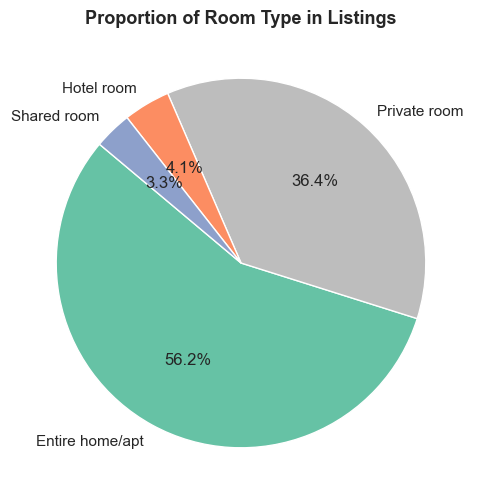

In [612]:
# Count the occurrences of each room type
room_type_counts = df['room_type'].value_counts()

# Plot the counts as a pie chart
plt.figure(figsize=(8, 6))
plt.pie(room_type_counts, labels=room_type_counts.index, autopct='%1.1f%%', startangle=140,
        colors=['#66c2a5', '#bdbdbd', '#fc8d62', '#8da0cb'])
plt.title('Proportion of Room Type in Listings', fontsize=13, fontweight='bold')
plt.show()

Following are some insight we can get from the above pie chart:
* The majority of listings (56%) are entire homes/apartments, driven by tourists and digital nomads who seek privacy and independence.
* Private rooms make up 37% of listings, catering to budget-conscious or solo travelers who prefer a balance between cost and comfort.
* Only 4% of listings are hotels, which inidcates that traditional booking platforms still dominate this market in Bangkok.
* Shared rooms are the least common (3%), reflecting limited demand for shared accommodations in Bangkok.

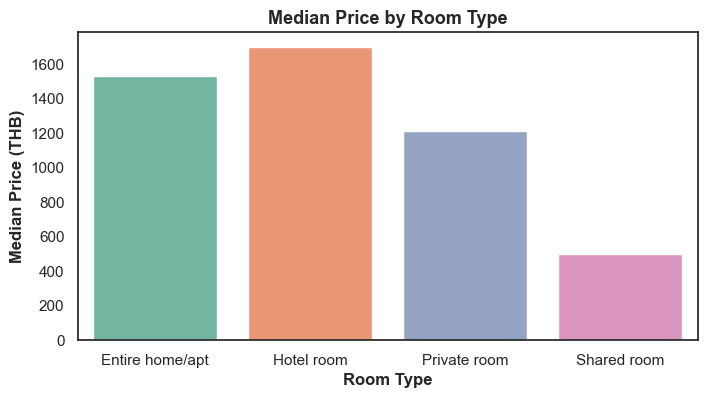

In [587]:
# Median price by Room Type
plt.figure(figsize=(8, 4))
sns.barplot(data=df, x='room_type', y='price', estimator=np.median, ci=0, palette='Set2')
plt.title('Median Price by Room Type', fontsize=13, fontweight='bold')
plt.xlabel('Room Type', fontweight='bold')
plt.ylabel('Median Price (THB)', fontweight='bold')
plt.show()

Insights:
* Hotel rooms have the highest median price among the room types, suggesting that traditional hotel accommodations are positioned as more premium options compared to Airbnb offerings.
* Entire homes/apartments follow closely behind hotel rooms in terms of median price. This aligns with the preference for entire accommodations by tourists and digital nomads, who may value privacy and additional amenities, making these listings more costly.
* Private rooms offer a more affordable price point while still giving guests a degree of privacy. This option caters to budget-conscious travelers who may want more privacy than shared rooms without the higher price of entire homes or hotels.
* Shared rooms are priced the lowest, which reflects their limited appeal and suitability mainly for budget travelers who prioritize cost savings over privacy. Given the small percentage of shared rooms in Bangkok’s Airbnb market, this suggests a relatively low demand for such accommodations.

#### **Rental Type**

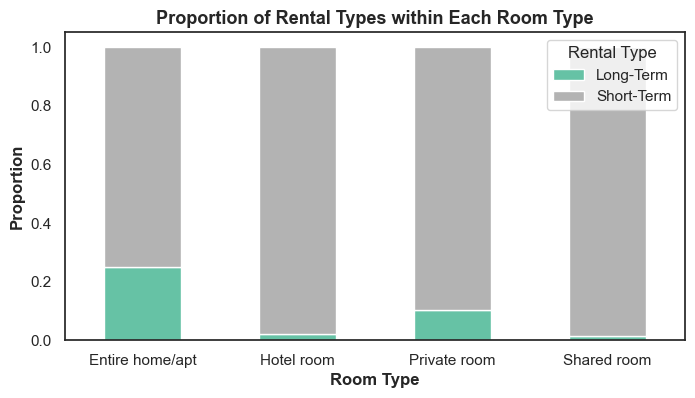

In [576]:
# Calculate the proportion of rental types within each room type
rental_proportions = df.groupby(['room_type', 'rental_type']).size().unstack()
rental_proportions = rental_proportions.div(rental_proportions.sum(axis=1), axis=0)  # Normalize to get proportions

rental_proportions.plot(kind='bar', stacked=True, figsize=(8, 4), colormap='Set2')
plt.title('Proportion of Rental Types within Each Room Type', fontsize=13, fontweight='bold')
plt.xlabel('Room Type', fontweight='bold')
plt.ylabel('Proportion', fontweight='bold')
plt.legend(title='Rental Type')
plt.xticks(rotation=0)
plt.show()

* Short-term rentals (<28 days) dominate across all room types, especially for hotel rooms and shared rooms, which are almost exclusively short-term. This suggests a strong preference for short-term bookings in Bangkok, likely driven by the high tourist demand.
* Entire homes/apartments have the most balanced mix of rental types, with a notable proportion of long-term rentals. This indicates that entire homes are attractive for both short-term tourists and longer-term guests, such as digital nomads or expatriates who prefer independent living spaces.
* Hosts with entire homes/apartments have the flexibility to target both short-term tourists and long-term residents. They can leverage this flexibility by offering competitive pricing for long-term stays during low-demand periods or setting attractive rates for short-term tourists in peak seasons.

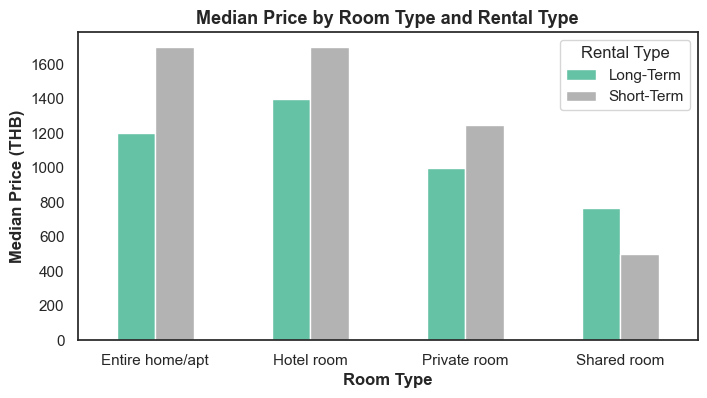

In [582]:
# Calculate the median price for each combination of room_type and rental_type
median_prices = df.groupby(['room_type', 'rental_type'])['price'].median().unstack()

# Plot the stacked bar chart

median_prices.plot(kind='bar', figsize=(8, 4), colormap="Set2")
plt.title('Median Price by Room Type and Rental Type', fontsize=13, fontweight='bold')
plt.xlabel('Room Type', fontweight='bold')
plt.ylabel('Median Price (THB)', fontweight='bold')
plt.legend(title='Rental Type')
plt.xticks(rotation=0)
plt.show()

From the above graph,  we can draw the following insights:
* For most room types, short-term rentals have a higher median price compared to long-term rentals. This reflects the higher demand and premium pricing that short-term stays typically command, especially in a tourist-heavy city like Bangkok.
* The price gap between short-term and long-term rentals is especially prominent for entire homes/apartments. This suggests that entire homes are significantly more valuable for short-term stays, likely due to demand from tourists who prioritize privacy and amenities, which are more profitable for hosts on a per-night basis.
* Private rooms and shared rooms have smaller price differences between long-term and short-term rentals. This indicates that these more affordable room types are less sensitive to rental duration, possibly due to lower overall demand or a consistent base of budget-conscious travelers looking for cost-effective options.

### 3.2. Anaysis based on Popularity and Demand Indicators

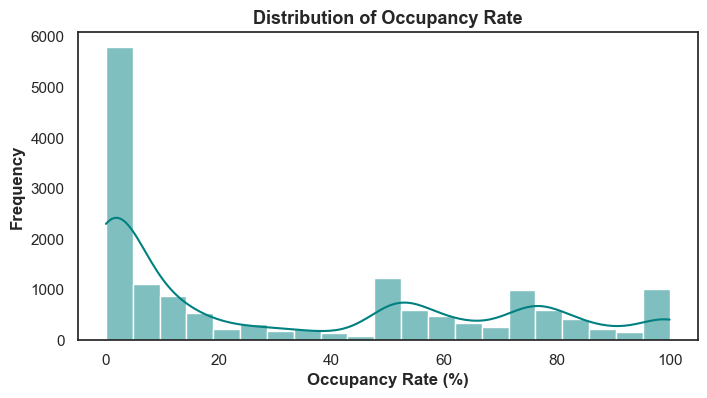

In [599]:
plt.figure(figsize=(8, 4))
sns.histplot(df['occupancy_rate'], kde=True, color='teal')
plt.title('Distribution of Occupancy Rate', fontsize=13, fontweight='bold')
plt.xlabel('Occupancy Rate (%)',  fontweight='bold')
plt.ylabel('Frequency',  fontweight='bold')
plt.show()

Insights:
* The largest portion of listings has a low occupancy rate, with a peak around 0-10%. This suggests that a significant number of listings are underutilized or rarely booked, which could indicate an oversupply of listings relative to demand or poor performance of specific listings due to factors such as location, pricing, or lack of reviews.
* The chart has a long tail with varying occupancy rates from 10% to 100%, indicating a diverse range of listing performance. While most listings fall on the lower end of occupancy, some achieve high rates, showing that certain listings are effectively capturing demand.
* Listings with very low occupancy rates may benefit from optimization strategies, such as adjusting pricing, improving listing descriptions, enhancing amenities, or focusing on guest reviews to increase attractiveness. This could help hosts improve their occupancy and make their listings more competitive.
* The high number of low-occupancy listings may also reflect market saturation, where the supply of listings exceeds demand, especially in less popular areas or for lower-quality listings. Hosts in these segments might need to differentiate their offerings or focus on niche markets.


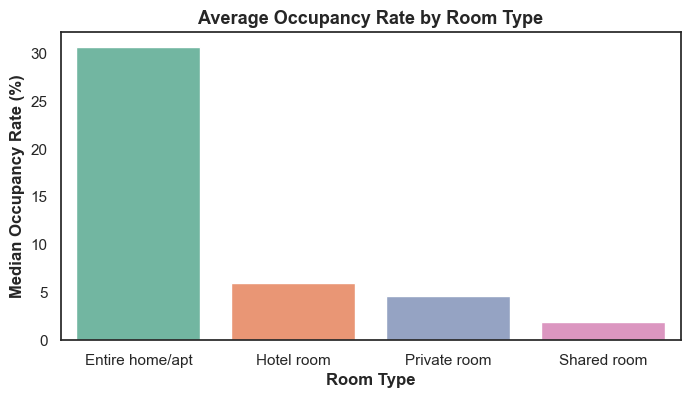

In [588]:
plt.figure(figsize=(8, 4))
sns.barplot(data=df, x='room_type', y='occupancy_rate', estimator='median', ci=0, palette='Set2')
plt.title('Average Occupancy Rate by Room Type', fontsize=13, fontweight='bold')
plt.xlabel('Room Type', fontweight='bold')
plt.ylabel('Median Occupancy Rate (%)', fontweight='bold')
plt.show()

Insights:
* Entire homes/apartments have a significantly higher average occupancy rate than other room types, indicating they are the most popular choice among Airbnb guests. This aligns with traveler preferences for privacy, space, and independent living facilities, especially for tourists, families, and long-term guests.
* Hotel rooms, private rooms, and shared rooms have much lower occupancy rates compared to entire homes/apartments. This could suggest a preference shift among Airbnb users towards entire homes, possibly due to the appeal of a “home away from home” experience that hotels and shared spaces cannot provide.
* The high occupancy rate for entire homes suggests a strong market demand in this segment. Hosts with entire homes could further leverage this trend by maintaining competitive pricing, enhancing amenities, or targeting specific groups like families and digital nomads who prefer full living spaces.
* The low occupancy rates for private rooms and shared rooms may indicate a degree of market saturation or misalignment with guest preferences. Hosts in these categories may need to enhance their offerings or reposition their listings (e.g., by targeting budget travelers) to increase attractiveness.

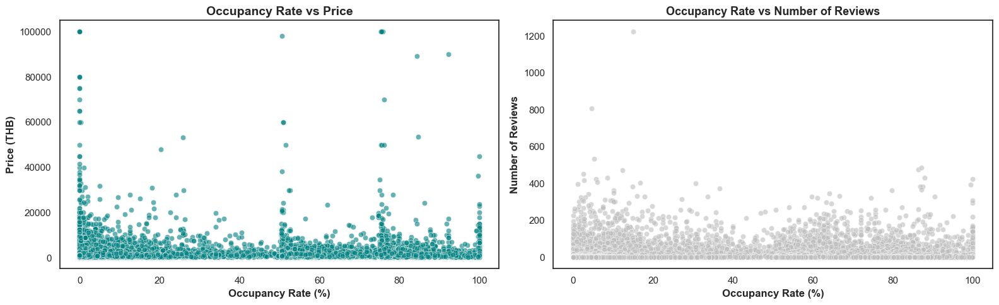

In [598]:
# Set up a figure with two subplots side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))  # 1 row, 2 columns

# First scatter plot: Occupancy Rate vs Price
sns.scatterplot(data=df, x='occupancy_rate', y='price', alpha=0.6, ax=ax1, color='teal')
ax1.set_title('Occupancy Rate vs Price', fontsize=14, fontweight='bold')
ax1.set_xlabel('Occupancy Rate (%)', fontweight='bold')
ax1.set_ylabel('Price (THB)', fontweight='bold')

# Second scatter plot: Occupancy Rate vs Number of Reviews
sns.scatterplot(data=df, x='occupancy_rate', y='number_of_reviews', alpha=0.6, ax=ax2, color='#bdbdbd')
ax2.set_title('Occupancy Rate vs Number of Reviews', fontsize=13, fontweight='bold')
ax2.set_xlabel('Occupancy Rate (%)', fontweight='bold')
ax2.set_ylabel('Number of Reviews', fontweight='bold')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

Occupancy rate vs. Price (left plot)
* There doesn’t appear to be a strong correlation between occupancy rate and price. Listings with both high and low prices exhibit a wide range of occupancy rates, indicating that pricing alone may not determine occupancy levels.
* Some listings are priced extremely high (above 20,000 THB) but have low occupancy rates. This suggests that high-priced listings may struggle to attract bookings, likely because they cater to a niche market or may be overvalued.
* A large number of low-priced listings also have low occupancy rates. This could indicate an oversupply of budget listings, making it harder for these properties to stand out and achieve high occupancy.
* Since occupancy doesn’t consistently increase with lower prices, hosts might benefit from positioning their listings at a competitive mid-range price with added value (like better amenities) rather than reducing prices significantly to attract guests.


Occupancy rate vs. Number of reviews (right plot)
* Higher Occupancy with More Reviews: Listings with more reviews generally show higher occupancy rates, suggesting that review count may positively impact booking frequency. Guests may feel more confident booking listings with numerous reviews, as they provide social proof and perceived reliability.
* Many listings with low occupancy also have few or no reviews, which could indicate new listings that haven’t yet gained visibility or guest trust. Building up reviews through competitive pricing or promotional strategies may help these listings increase occupancy.
* A large concentration of listings with low occupancy and few reviews indicates potential market saturation. These listings may face challenges in standing out without a strong reputation or distinguishing features.
* The positive relationship between occupancy and number of reviews highlights the importance of guest feedback. Hosts can improve their listings’ attractiveness by actively seeking reviews, providing excellent service, and addressing guest feedback to increase ratings and visibility.

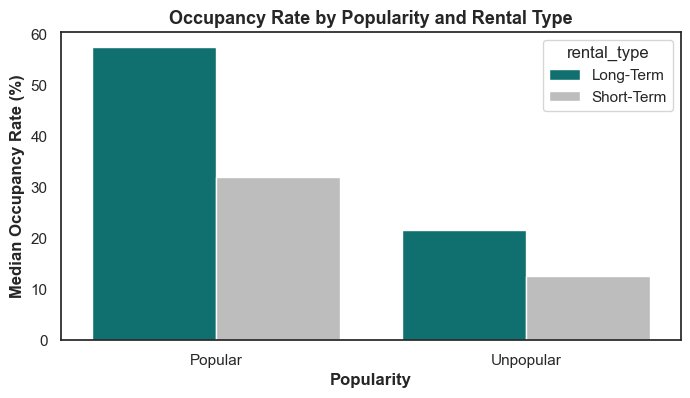

In [596]:

# Enhanced bar plot with data labels
plt.figure(figsize=(8, 4))
ax = sns.barplot(data=df, x='popularity', y='occupancy_rate', estimator='median', ci=0, hue='rental_type', palette=['teal', '#bdbdbd'])

plt.title('Occupancy Rate by Popularity and Rental Type', fontsize=13, fontweight='bold')
plt.xlabel('Popularity', fontweight='bold')
plt.ylabel('Median Occupancy Rate (%)', fontweight='bold')

plt.show()

Here are some takeaways from the above graph:
* Popular listings with a long-term rental type have the highest median occupancy rate (around 50-60%). This indicates that these popular listings may have high minimum night requirements, attracting guests who book for longer stays. This likely boosts occupancy rates as fewer turnovers are needed compared to short-term rentals.
* Popular short-term rentals have a lower median occupancy rate than long-term rentals but still outperform both rental types within the unpopular category. This suggests that even among short-term rentals, popularity helps attract a steady stream of guests, although it may not reach the high occupancy levels of popular long-term rentals.
* For both long-term and short-term rental types, unpopular listings have lower occupancy rates. This suggests that popularity is a crucial factor in driving occupancy, whether the listing is for short- or long-term stays. Unpopular listings may struggle to attract guests consistently due to factors like fewer reviews, less visibility, or less competitive features.
* The higher occupancy rates for long-term rental types support the idea that a high minimum night requirement (characteristic of long-term rentals) could positively impact occupancy. By targeting guests who need longer stays, these listings can maintain higher occupancy without frequent turnover, which is particularly advantageous for hosts aiming for stable occupancy.

### **3.3 Time-based Analysis**

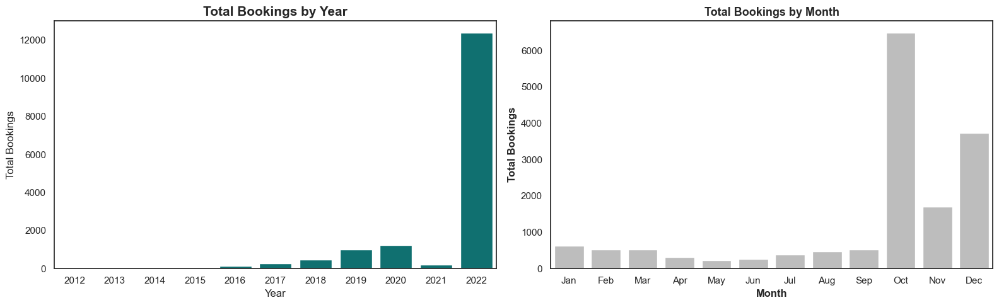

In [595]:
# Convert 'last_review' to datetime
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# Extract the year and month from 'last_review'
df['year'] = df['last_review'].dt.year
df['month'] = df['last_review'].dt.month

# Count the number of bookings per year and month
bookings_per_year = df.groupby('year')['name'].count().reset_index()
bookings_per_year.rename(columns={'name': 'count_of_name'}, inplace=True)

bookings_per_month = df.groupby('month')['name'].count().reset_index()
bookings_per_month.rename(columns={'name': 'count_of_name'}, inplace=True)

# Convert year to string to treat it as categorical data
bookings_per_year['year'] = bookings_per_year['year'].astype(str)

# Set up the figure and axes for two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Plot total bookings by year on the first subplot
sns.barplot(data=bookings_per_year, x='year', y='count_of_name', color='teal', ax=ax1)

# Set labels and title for year plot
ax1.set_title("Total Bookings by Year", fontsize=15, fontweight='bold')
ax1.set_xlabel("Year", fontsize=12)
ax1.set_ylabel("Total Bookings", fontsize=12)

# Plot total bookings by month on the second subplot
sns.barplot(data=bookings_per_month, x='month', y='count_of_name', color='#bdbdbd', ax=ax2)

# Set labels and title for month plot
ax2.set_title("Total Bookings by Month", fontsize=13, fontweight='bold')
ax2.set_xlabel("Month", fontweight='bold')
ax2.set_ylabel("Total Bookings", fontweight='bold')
ax2.set_xticks(range(12))
ax2.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.tight_layout()
plt.show()

Total bookings by year (left graph):
* The graph shows a substantial increase in total bookings in 2022 compared to previous years. This spike is likely due to a post-pandemic rebound in travel as restrictions eased, and people began traveling more. It highlights a strong recovery in the Airbnb market in Bangkok after a period of stagnation.
* From 2016 to 2019, bookings remained relatively low and stable, indicating that while Airbnb in Bangkok was present, it may not have been as widely adopted or popular until recently. This could be due to a combination of factors, such as market awareness, competition from traditional hotels, and Airbnb’s slower growth in Southeast Asia before the pandemic.
* The dramatic growth in 2022 may indicate a strong, potentially sustained interest in Airbnb as a travel accommodation option in Bangkok. If this trend continues, it could signal a shift in traveler preference toward short-term rentals in the city, offering new opportunities for Airbnb hosts.

Total bookings by month (right graph):
* The months of October, November, and December show the highest bookings, indicating that the last quarter of the year is a peak travel season in Bangkok. This peak could be attributed to several factors such as festivals, holidays, and weather.
* The middle months (April to August) have notably lower booking volumes, suggesting an off-peak season during this period. This could be a combination of factors, such as fewer events and weather. April to June is Bangkok's hot season, while July to August is rainy season, leading to lower booking numbers.

### **3.4 Location-based Analysis**

#### **Neighbourhood**

In [524]:
import plotly.express as px
import geopandas as gpd
import plotly.graph_objects as go 
from geopy.distance import geodesic
import json

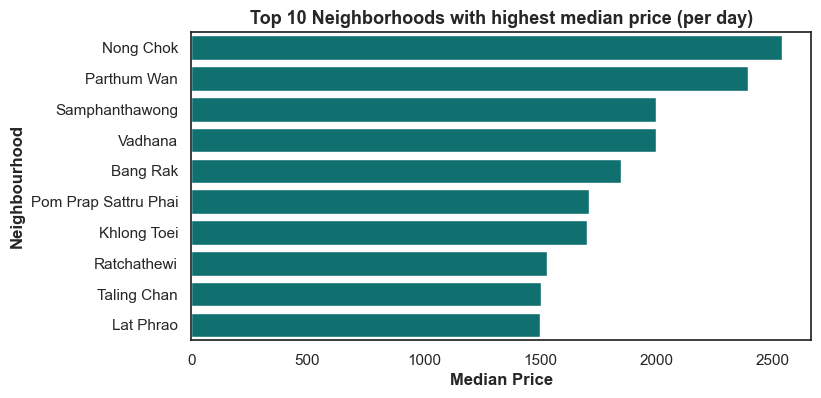

In [601]:
#Calculate the median price by neighborhood
median_price_by_neighbourhood = df.groupby('neighbourhood')['price'].median().reset_index()

# Get the top 10 neighborhoods with the highest median price
top_neighbourhoods_price = median_price_by_neighbourhood.nlargest(10, 'price').copy()
top_neighbourhoods_price["neighbourhood"] = top_neighbourhoods_price["neighbourhood"].astype(str)

plt.figure(figsize=(8,4))
sns.barplot(data=top_neighbourhoods_price, x='price', y='neighbourhood', color='teal')
plt.title('Top 10 Neighborhoods with highest median price (per day)', fontsize=13, fontweight='bold')
plt.xlabel('Median Price', fontweight='bold')
plt.ylabel('Neighbourhood', fontweight='bold')
plt.show()

* Nong Chok and Pathum Wan are the neighborhoods with the highest median prices, with Nong Chok significantly ahead of the others. This could indicate these areas have higher demand or are positioned as premium locations for Airbnb listings.
* The difference in median prices among these top neighborhoods suggests a varied range of accommodation standards and amenities. Neighborhoods like Nong Chok might have unique features or luxury listings that elevate the median price.
* The high prices in these neighborhoods could be due to proximity to tourist attractions, shopping areas, business districts, or the availability of high-end amenities, which may attract a specific type of traveler willing to pay a premium.

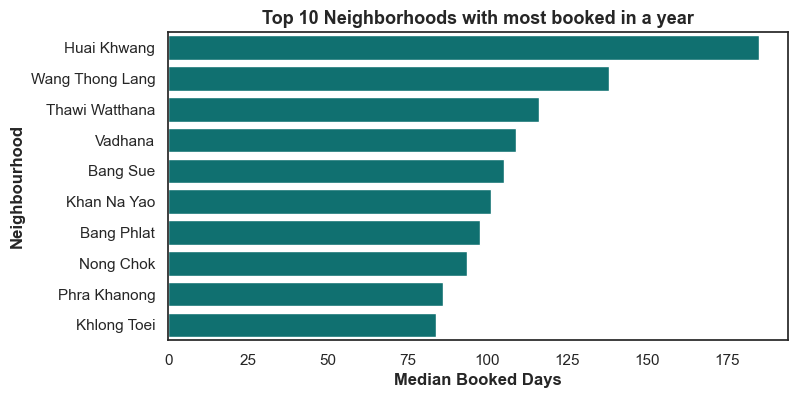

In [603]:
# Calculate the total number of reviews by neighborhood
most_booked_by_neighbourhood = df.groupby('neighbourhood')['booked_days'].median().reset_index()

# Set the top 10 neighborhoods by total number of reviews and save it as a new DataFrame
top_neighbourhoods_booked = most_booked_by_neighbourhood.nlargest(10, 'booked_days').copy()
top_neighbourhoods_booked["neighbourhood"] = top_neighbourhoods_booked["neighbourhood"].astype(str)

plt.figure(figsize=(8,4))
sns.barplot(data=top_neighbourhoods_booked, x='booked_days', y='neighbourhood', color='teal')
plt.title('Top 10 Neighborhoods with most booked in a year', fontsize=13, fontweight='bold')
plt.xlabel('Median Booked Days', fontweight='bold')
plt.ylabel('Neighbourhood', fontweight='bold')
plt.show()

* Huai Khwang leads significantly in terms of median booked days, indicating a high demand for Airbnb listings in this neighborhood. This might suggest that it has attributes particularly appealing to guests, such as convenient location, access to amenities, or affordability.
* Interestingly, Nong Chok appears in both the top neighborhoods for the highest median price and for median booked days. This indicates that Nong Chok may be a premium area that not only commands higher prices but also has a solid booking rate, making it attractive for both revenue potential and high occupancy.
* The presence of neighborhoods like Bang Sue and Khan Na Yao, which are not typically premium areas, suggests that these locations are appealing to a different segment of travelers, possibly due to affordability or specific nearby attractions.

In [604]:
fig = px.scatter_mapbox(df, lat='latitude', lon='longitude', 
                        hover_name='name',
                        zoom=9, height=600)

# Set a fixed color for all points
fig.update_traces(marker=dict(color='teal', size=7, opacity=0.7))  
fig.update_layout(mapbox_style='open-street-map', margin={"r":2,"t":2,"l":2,"b":2})
fig.show()

The neighborhood boundaries in the GeoJSON data will be incorporated to provide a clearer understanding of the spatial layout of different areas. By visually defining each neighborhood, it becomes easier to analyze spatial patterns, such as the distribution of Airbnb listings, price variations, and proximity to key locations. This addition allows for a more precise examination of how neighborhood characteristics may impact listing performance, making it possible to see patterns and trends that might otherwise be overlooked.

In [539]:
# Example Data: Aggregating number of listings per neighbourhood
listings_by_neighbourhood = df.groupby('neighbourhood').size().reset_index(name='listing_count')

# Load GeoJSON file
with open("Bangkok_Neighbourhoods.geojson") as f:
    geojson = json.load(f)

# Prepare list of neighbourhoods and their listing counts
neighbourhood_names = listings_by_neighbourhood['neighbourhood']
listing_counts = listings_by_neighbourhood['listing_count']

# Create the choropleth map without individual markers
fig = go.Figure(go.Choroplethmapbox(
    geojson=geojson,
    featureidkey="properties.neighbourhood",  
    locations=neighbourhood_names,       # Neighbourhood names from aggregated data
    z=listing_counts,                    # Count of listings for color gradation
    colorscale="Magma",
    colorbar_title="# of Listings",
    marker_opacity=0.6,
    marker_line_width=2,
    marker_line_color='black'
))

# Final layout adjustments
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_zoom=9,
    mapbox_center={"lat": df['latitude'].mean(), "lon": df['longitude'].mean()},
    margin={"r":2, "t":2, "l":2, "b":2}
)
fig.show()

Here are some key observations:
* The neighborhoods in central Bangkok, especially around the inner city, have the highest listing density. This aligns with the high popularity of central areas for tourists and business travelers due to easy access to attractions, shopping districts, and major transit routes.
* The listing density appears to decrease as we move outward from the center of Bangkok. This could reflect lower tourist demand in peripheral areas or fewer commercial amenities that typically attract short-term visitors.

In [541]:
# Calculate average price for each neighbourhood
avg_price_by_neighbourhood = df.groupby('neighbourhood')['price'].median().reset_index()

# Load GeoJSON file with neighbourhood boundaries
with open("Bangkok_Neighbourhoods.geojson") as f:
    geojson = json.load(f)

# Create choropleth map
fig = go.Figure(go.Choroplethmapbox(
    geojson=geojson,
    featureidkey="properties.neighbourhood",     
    locations=avg_price_by_neighbourhood['neighbourhood'],
    z=avg_price_by_neighbourhood['price'],      
    colorscale="Magma",                         
    colorbar_title="Median Price",
    marker_opacity=0.6,
    marker_line_width=2,
    marker_line_color="black"                    
))

# Set map layout
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_zoom=9,
    mapbox_center={"lat": df['latitude'].mean(), "lon": df['longitude'].mean()},
    margin={"r":2, "t":2, "l":2, "b":2}
)

fig.show()

Form the above map, we can observe that:
* The neighborhoods with darker shades, indicating higher median prices, are predominantly located in central Bangkok. This aligns with the demand for central locations, where proximity to attractions, business centers, and high-end amenities drives up the cost of listings.
* Nong Chok and Pathum Wan stand out with the highest median prices. This suggests a premium market in these areas, possibly due to luxury listings, exclusive services, or prime locations that appeal to travelers willing to pay more for convenience and quality.

To gain a more precise understanding of how location influences Airbnb listing prices in Bangkok, several key locations were added based on knowledge of popular places within the city. These key locations include well-known areas such as the city center, major tourist attractions, and popular shopping districts.

In [544]:
key_locations = {
    'City Center': (13.7563, 100.5018),
    'Grand Palace': (13.7500, 100.4917),
    'Chatuchak Market': (13.8007, 100.5539),
    'Siam Paragon': (13.7467, 100.5345),
    'Bangkok National Museum': (13.7585, 100.4909),
    'Wat Arun': (13.7436, 100.4889),
    'Lumpini Park': (13.7300, 100.5411),
    'Don Mueang Airport': (13.9126, 100.6069),
    'Suvarnabhumi Airport': (13.6894, 100.7510),
    'Asiatique Riverfront': (13.7057, 100.5108),
    'Khao San Road': (13.7596, 100.4973)
}

df['listing_coords'] = df[['latitude', 'longitude']].apply(tuple, axis=1)

# Calculate distance to each key location and add it as a new column
for location_name, location_coords in key_locations.items():
    df[f'distance_to_{location_name.replace(" ", "_").lower()}'] = df['listing_coords'].apply(lambda x: geodesic(x, location_coords).kilometers)

df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,distance_to_grand_palace,distance_to_chatuchak_market,distance_to_siam_paragon,distance_to_bangkok_national_museum,distance_to_wat_arun,distance_to_lumpini_park,distance_to_don_mueang_airport,distance_to_suvarnabhumi_airport,distance_to_asiatique_riverfront,distance_to_khao_san_road
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,...,5.477496,4.721320,1.630166,5.456846,5.948809,3.300403,18.328057,23.978516,6.839307,4.762787
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,...,16.275138,16.160322,12.433955,16.885852,16.150910,10.664336,27.062917,14.713077,12.189063,16.407672
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,...,14.312607,9.281518,9.701532,14.412792,14.645133,9.301886,17.829353,15.397959,13.287722,13.728039
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,...,9.713519,2.444282,6.168652,9.423333,10.306940,7.285594,14.252006,22.181415,11.313152,8.733207
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,...,15.461395,9.294285,10.967502,15.449719,15.870309,10.860646,16.173931,15.454931,14.979337,14.750685


To determine whether key locations, such as the city center, popular tourist attractions, and major shopping areas, impact the price of Airbnb listings, the distance from each listing to these key locations was measured. Analyzing the proximity of each listing to these points of interest helps reveal if being closer to high-demand areas correlates with higher listing prices. This approach explores how location influences pricing and identifies the premium that guests may be willing to pay for convenience and accessibility to popular spots.

In [545]:
# Select columns related to price and distances
distance_columns = [col for col in df.columns if col.startswith('distance_to')]
correlation_data = df[['price'] + distance_columns]

# Calculate the correlation matrix
correlation_matrix = correlation_data.corr()

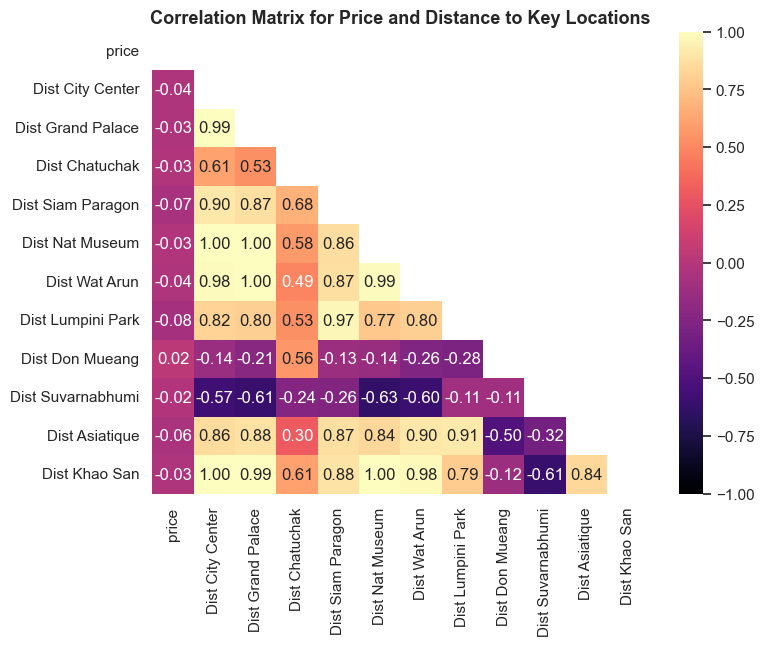

In [609]:
# Dictionary to rename columns
short_names = {
    'distance_to_city_center': 'Dist City Center',
    'distance_to_grand_palace': 'Dist Grand Palace',
    'distance_to_chatuchak_market': 'Dist Chatuchak',
    'distance_to_siam_paragon': 'Dist Siam Paragon',
    'distance_to_bangkok_national_museum': 'Dist Nat Museum',
    'distance_to_wat_arun': 'Dist Wat Arun',
    'distance_to_lumpini_park': 'Dist Lumpini Park',
    'distance_to_don_mueang_airport': 'Dist Don Mueang',
    'distance_to_suvarnabhumi_airport': 'Dist Suvarnabhumi',
    'distance_to_asiatique_riverfront': 'Dist Asiatique',
    'distance_to_khao_san_road': 'Dist Khao San'
}

# Rename columns in the DataFrame for easier readability
df_renamed = df.rename(columns=short_names)

# Select columns related to price and renamed distances
correlation_data = df_renamed[['price'] + list(short_names.values())]

# Calculate the correlation matrix
correlation_matrix = correlation_data.corr()
matrix = np.triu(correlation_matrix)

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='magma', fmt=".2f", vmin=-1, vmax=1, center=0, mask= matrix)
plt.title('Correlation Matrix for Price and Distance to Key Locations', fontsize=13, fontweight='bold')
plt.show()

From the correlation analysis above, here are some interesting founds:
* The correlation between Airbnb listing prices and distance to key locations (like the city center, Grand Palace, and Khao San Road) is close to zero, indicating a very weak relationship. This suggests that being closer or farther from these specific attractions does not significantly affect the listing price.
* This finding could imply that other factors, such as property features, amenities, listing quality (e.g., luxury accommodations vs. budget stays), or neighborhood attributes (like safety, accessibility to local businesses, or overall ambiance), are more critical in determining listing prices.
* Distance to Don Mueang and Suvarnabhumi airports has weak or even slightly negative correlations with the distances to central attractions (e.g., Grand Palace, Siam Paragon). This pattern reflects the airports’ locations on the outskirts of the city, further from central attractions.

In [547]:
# Convert key locations to a DataFrame 
key_locations_df = pd.DataFrame({
    'name': list(key_locations.keys()),
    'latitude': [coords[0] for coords in key_locations.values()],
    'longitude': [coords[1] for coords in key_locations.values()]
})

In [608]:
# Create the map figure
fig = go.Figure()

# Add Airbnb listings as points, colored by price
fig.add_trace(go.Scattermapbox(
    lat=df['latitude'],
    lon=df['longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=6,
        color=df['price'],
        colorscale='Magma',  
        colorbar=dict(title="Price")
    ),
    name='Airbnb Listings' 
))

# Add key locations as markers without a legend
for i, row in key_locations_df.iterrows():
    fig.add_trace(go.Scattermapbox(
        lat=[row['latitude']],
        lon=[row['longitude']],
        mode='markers+text',
        marker=go.scattermapbox.Marker(
            size=10,
            color='red'
        ),
        text=row['name'],
        textposition="top right",
        showlegend=False  
    ))
    
    # Draw buffer zone (5 km circle)
    buffer_radius = 5 / 6371  # Earth radius in km to radians
    theta = np.linspace(0, 2 * np.pi, 100)
    circle_lat = row['latitude'] + (buffer_radius * np.sin(theta) * (180 / np.pi))
    circle_lon = row['longitude'] + (buffer_radius * np.cos(theta) * (180 / np.pi)) / np.cos(row['latitude'] * np.pi / 180)
    
    fig.add_trace(go.Scattermapbox(
        lat=circle_lat,
        lon=circle_lon,
        mode='lines',
        line=dict(color='red', width=2),
        fill="toself",
        fillcolor="rgba(255, 0, 0, 0.1)",
        showlegend=False
    ))

# Set the layout with Mapbox
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=13.7563, lon=100.5018),
        zoom=9
    ),
    margin={"r":0,"t":0,"l":0,"b":0},
    title='Price (THB)'
)

fig.show()

----
# **4. Conclusion and Recommendations**

### **4.1. Conclusion**

1. **Key Factors Influencing Price**: Listing attributes such as room type, availability, and guest reviews are significant determinants of price. Entire homes or apartments generally command higher prices compared to private rooms, and well-reviewed listings often have higher demand, allowing hosts to set premium rates.

2. **Impact of Listing Attributes on Performance**: Attributes like room type and availability are closely linked to performance metrics such as occupancy rates and popularity. Listings that are available more frequently, with clear and attractive descriptions, tend to perform better in terms of bookings and revenue.

3. **Identification of Airbnb Hotspots**: The analysis identified central Bangkok areas, particularly near major attractions and commercial centers, as primary hotspots. These neighborhoods attract a high density of listings, indicating strong demand from travelers who seek convenient access to popular sites.

4. **Spatial Patterns in Pricing**: There are noticeable spatial pricing patterns across Bangkok, with higher prices concentrated in central neighborhoods and areas with high accessibility to attractions. Peripheral neighborhoods, while less expensive, cater to budget-conscious or long-term guests.

5. **Influence of Location on Price**: Although proximity to key locations (such as tourist attractions and city hubs) does impact prices, the correlation is not as strong as anticipated. This suggests that while location matters, other factors like listing quality, unique features, and host reputation also play critical roles in pricing.

### **4.2. Recommendations**

Based on these insights, here are targeted strategies for hosts to optimize their Airbnb listing prices effectively:

1. **Enhance Listing Quality and Amenities:**
	- Focus on improving the overall quality of the listing. Providing high-quality photos, detailed descriptions, and showcasing unique amenities can make a listing stand out, allowing for higher pricing.
	- Invest in guest comforts, such as high-speed Wi-Fi, premium bedding, or locally-inspired decor. Listings with desirable amenities can attract more bookings and justify a higher price point, especially in competitive areas.
2. **Leverage Positive Guest Reviews:**
	- Encourage guests to leave reviews, as listings with strong ratings tend to attract more bookings and allow hosts to set premium prices. Responding to reviews promptly and addressing guest concerns can help build a positive reputation.
	- Offer small incentives, like early check-in or a local treat, to enhance the guest experience and increase the likelihood of positive reviews.
3. **Optimize Room Type and Availability:**
	- Entire apartments or homes generally attract higher-paying guests, so consider offering entire properties if possible.
	- Ensure that availability is optimized by balancing short-term and long-term bookings to maintain occupancy. During peak tourist seasons, consider implementing minimum stay requirements to maximize earnings.
4. **Highlight Location Advantages:**
	- Even if the listing is not centrally located, emphasize any unique aspects of the neighborhood, such as local markets, community vibes, or nearby attractions. Highlighting these features can appeal to travelers interested in experiencing local culture.
	- For listings near key attractions, include keywords like “close to downtown” or “near popular sites” in the title and description to attract travelers looking for convenience, which can support higher pricing.
5. **Adjust Pricing Dynamically Based on Seasonality and Demand:**
	- Use dynamic pricing strategies to adjust rates based on demand, peak tourist seasons, and local events. Higher prices during high-demand periods can increase revenue without reducing occupancy.
	- In low-demand periods, consider reducing prices or offering discounts to maintain occupancy and attract budget-conscious travelers.
6. **Consider Targeting Specific Guest Segments:**
	- If the listing is located near airports or business districts, tailor amenities and descriptions to appeal to business travelers or layover tourists, who may value convenience over proximity to tourist attractions.
	- For listings in more tranquil or suburban neighborhoods, target long-term stays by offering discounts for weekly or monthly bookings, which can help stabilize occupancy and income.
7. **Utilize Data for Continuous Optimization:**
	- Regularly monitor the performance metrics and adjust pricing based on the competitive landscape. Tracking occupancy rates, booking lead times, and guest demographics can provide insights into optimizing prices.
	- Analyzing competitor pricing within the same neighborhood can also help ensure the listing remains competitively priced.

----
# **References**

1. https://news.airbnb.com/about-us/
2. https://www.airbnb.com/help/article/475